# Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


# Severstal: Steel Defect Detection


# 1 Importing libraries

In [ ]:
import pandas as pd
import numpy as np
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import math
from tensorflow import keras
from tensorflow.keras.layers import  Flatten , Input , Dense , Dropout, Concatenate , BatchNormalization , Conv2D , GlobalAveragePooling2D, Activation
from tensorflow.keras.models import Model ,load_model, save_model
from tensorflow.keras.optimizers import Adam , SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint,TensorBoard
from tensorflow.keras.losses import categorical_crossentropy, binary_crossentropy
from sklearn.metrics import classification_report ,log_loss, accuracy_score , confusion_matrix, multilabel_confusion_matrix
import tensorflow.keras.backend as K
from tqdm.notebook import tqdm
%load_ext tensorboard
import datetime
from tensorflow.keras.utils import Sequence
import os

from PIL import Image
from pathlib import Path
from collections import defaultdict
AUTOTUNE = tf.data.experimental.AUTOTUNE

#2 Lets define a custom metrics which we can use at the various stages of model experimentation

In [ ]:
# After some manual testing i found categorical_accuracy behaving hap-harzardly giving very different results in different experiments in multilel classification hence i went ahead and 
# implemented a custom metrics to calculate the same and we can see how the two metrics are not same

# https://stackoverflow.com/questions/53037451/keras-custom-metrics-for-multi-label-classfication


def full_multi_label_accuracy_score(y_true, y_pred):
    '''This function returns the full accuracy in multilabel problems.
    For example if y_true =[[1,1,1,1],
                            [1,0,1,0],
                            [0,0,0,0],
                            [0,0,0,1]]
                and y_pred =[[1,1,1,1],
                            [1,0,1,0],
                            [0,0,0,0],
                            [0,0,0,0]]

                The accuracy return will be 0.75 as it calculate full accuracy. As we can see the 4th entry doesnt match between y_true and y_pred
    '''
    comp = K.equal(y_true, K.round(y_pred))
    return K.mean(K.cast(K.all(comp, axis=-1), K.floatx()))

#https://datascience.stackexchange.com/questions/45165/how-to-get-accuracy-f1-precision-and-recall-for-a-keras-model
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

def dice_coef_differentiable(y_true, y_pred, smooth=K.epsilon()):
    y_true = K.cast(y_true,dtype='float32')
  # The original dice metric is not differentiable. This approxiation is used to make it differentiable
    intersection = K.sum(K.sum(y_true * y_pred,axis=1),axis=1)
    return K.mean((2. * intersection + smooth) / (K.sum(K.sum(y_true,axis=1),axis=1) + 
                                                       K.sum(K.sum(y_pred,axis=1),axis=1) + smooth))
def dice_coef(y_true, y_pred, smooth=K.epsilon()):
    intersection = K.sum(K.sum(y_true * K.round(y_pred),axis=1),axis=1)
    return K.mean((2. * intersection + smooth) / (K.sum(K.sum(y_true,axis=1),axis=1) + 
                                                       K.sum(K.sum(K.round(y_pred),axis=1),axis=1) + smooth))    
 
# def dice_coef_differentiable(y_true, y_pred, smooth=K.epsilon()):
#   # The original dice metric is not differentiable. This approxiation is used to make it differentiable
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
#     intersection = K.sum(y_true_f * y_pred_f)
#     return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth) 


def dice_loss_differentiable(y_true, y_pred):
    return (1-dice_coef_differentiable(y_true,y_pred))

# def dice_coef(y_true, y_pred, smooth=K.epsilon()):
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
#     intersection = K.sum(y_true_f * K.round(y_pred_f))
#     return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(K.round(y_pred_f)) + smooth)  

dependencies_segmentation = {
    'dice_coef_differentiable':dice_coef_differentiable,
    'dice_loss_differentiable' :dice_loss_differentiable,
    'dice_coef':dice_coef
}   

dependencies_multilable = {
    'full_multi_label_accuracy_score':full_multi_label_accuracy_score
} 

# 3 Plotting function

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import time
# https://gist.github.com/greydanus/f6eee59eaf1d90fcb3b534a25362cea4
# https://stackoverflow.com/a/14434334

def plt_dynamic(x, y, y_1, ax, fig,colors=['b']):
    ax.plot(x, y, 'b', label="Train Loss")
    ax.plot(x, y_1, 'r', label="Test Loss")
    if len(x)==1:
        plt.legend()
    fig.canvas.draw()   

#4 Lets create a data in the form of X and y so that we can train it

In [ ]:
!pwd

/content


In [ ]:
!ls

drive  sample_data


In [ ]:
%cd /content/drive/My Drive/Colab Notebooks/Severstal

/content/drive/My Drive/Colab Notebooks/Severstal


In [ ]:
train_data=pd.read_csv('input/train_data.csv', index_col=0)

In [ ]:
train_data.head()

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,has_defect_1,has_defect_2,has_defect_3,has_defect_4,no_of_defects
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,NaN,NaN,NaN,1,1,0,0,0,1
1,00031f466.jpg,NaN,NaN,NaN,NaN,0,0,0,0,0,0
2,000418bfc.jpg,NaN,NaN,NaN,NaN,0,0,0,0,0,0
3,000789191.jpg,NaN,NaN,NaN,NaN,0,0,0,0,0,0
4,0007a71bf.jpg,NaN,NaN,18661 28 18863 82 19091 110 19347 110 19603 11...,NaN,1,0,0,1,0,1


In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12568 entries, 0 to 12567
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ImageId        12568 non-null  object
 1   Defect_1       897 non-null    object
 2   Defect_2       247 non-null    object
 3   Defect_3       5150 non-null   object
 4   Defect_4       801 non-null    object
 5   has_defect     12568 non-null  int64 
 6   has_defect_1   12568 non-null  int64 
 7   has_defect_2   12568 non-null  int64 
 8   has_defect_3   12568 non-null  int64 
 9   has_defect_4   12568 non-null  int64 
 10  no_of_defects  12568 non-null  object
dtypes: int64(5), object(6)
memory usage: 1.2+ MB


In [ ]:
train_data.shape

(12568, 11)

# 5 BINARY CLASSIFICATION


##5.1 Train_Test Split

In [ ]:
X_train_data, X_test_data= train_test_split(train_data, test_size=0.1,stratify=train_data['no_of_defects'] ,random_state=42)
X_train_data, X_val_data= train_test_split(X_train_data, test_size=0.2, stratify=X_train_data['no_of_defects'],random_state=42)

In [ ]:
X_train = X_train_data['ImageId']
y_train = X_train_data['has_defect']
X_val = X_val_data['ImageId']
y_val = X_val_data['has_defect']
X_test = X_test_data['ImageId']
y_test = X_test_data['has_defect']

In [ ]:
X_train.head()

4494     5b922560e.jpg
6708     87f74731f.jpg
11506    e9c9ac12d.jpg
10930    dde377e40.jpg
2656     358a4fc0c.jpg
Name: ImageId, dtype: object

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)
print(X_test.shape)
print(y_test.shape)

(9048,)
(9048,)
(2263,)
(2263,)
(1257,)
(1257,)


In [ ]:
X_train.head()

4494     5b922560e.jpg
6708     87f74731f.jpg
11506    e9c9ac12d.jpg
10930    dde377e40.jpg
2656     358a4fc0c.jpg
Name: ImageId, dtype: object

##5.2 Create Dataset tensor

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

In [ ]:
for i,j in train_dataset.take(1):
  print(i.numpy(),j.numpy())

b'5b922560e.jpg' 0


In [ ]:
for i in train_dataset.take(5):
  print(i)

(<tf.Tensor: shape=(), dtype=string, numpy=b'5b922560e.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'87f74731f.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'e9c9ac12d.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=1>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'dde377e40.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'358a4fc0c.jpg'>, <tf.Tensor: shape=(), dtype=int64, numpy=0>)


##5.3 Functions to Read Images, Augment Images and Resize Image so that they can be fed to machine learning models

In [ ]:
#https://cs230.stanford.edu/blog/datapipeline/
#https://www.tensorflow.org/guide/data

base_path ='train_images/'

#function to read the image and convert into pixel
def parse_function(image_path,label):
  image_string = tf.io.read_file(base_path+image_path)

  #Don't use tf.image.decode_image, or the output shape will be undefined
  image = tf.image.decode_jpeg(image_string, channels=3)

  #This will convert to float values in [0, 1]
  image = tf.image.convert_image_dtype(image, tf.float32)
  print(image)
  print(label)

  return image, label


#function to augment the images
def augment(image, label):
  image = tf.image.random_flip_left_right(image)
  image = tf.image.random_flip_up_down(image)
  image = tf.image.random_brightness(image, max_delta = 0.4)
  image = tf.image.random_crop(image, size=[224, 1568, 3])
  image = tf.clip_by_value(image, 0.0, 1.0)

  return image, label

#function to resize the images
def image_resize(image,label):
  resized_image = tf.image.resize(image, [256, 512])
  resized_image = tf.clip_by_value(resized_image, 0.0, 1.0)
  return resized_image, label

In [ ]:
train_dataset.take(1).map(parse_function)

Tensor("convert_image:0", shape=(None, None, 3), dtype=float32)
Tensor("args_1:0", shape=(), dtype=int64)


<MapDataset shapes: ((None, None, 3), ()), types: (tf.float32, tf.int64)>

## Testing the above function

In [ ]:
def visualize(original, augmented):
  fig = plt.figure()
  plt.subplot(1,2,1)
  plt.title('Original image')
  plt.imshow(original)

  plt.subplot(1,2,2)
  plt.title('Augmented image')
  plt.imshow(augmented)

<class 'tensorflow.python.framework.ops.EagerTensor'>
(256, 512, 3)


TensorShape([256, 1600, 3])

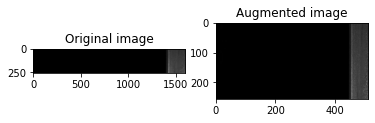

In [ ]:
from PIL import Image
image_path ='5b922560e.jpg'
image_strings = open(base_path+image_path, 'rb').read()
image_strings
#image = tf.image.decode_jpeg(files, channels=3)
#image
#image = Image.open(files)
#image
image = tf.image.decode_jpeg(image_string, channels=3)
cropped = tf.image.random_crop(image, size=[224, 1568, 3])
image = tf.image.convert_image_dtype(image, tf.float32)
cropped = tf.image.resize(image, [256, 512])
print(type(cropped))
print(cropped.shape)
visualize(image,cropped)
image.shape

In [ ]:
image_string

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\x03\x03\x03\x03\x04\x03\x03\x04\x05\x08\x05\x05\x04\x04\x05\n\x07\x07\x06\x08\x0c\n\x0c\x0c\x0b\n\x0b\x0b\r\x0e\x12\x10\r\x0e\x11\x0e\x0b\x0b\x10\x16\x10\x11\x13\x14\x15\x15\x15\x0c\x0f\x17\x18\x16\x14\x18\x12\x14\x15\x14\xff\xdb\x00C\x01\x03\x04\x04\x05\x04\x05\t\x05\x05\t\x14\r\x0b\r\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\xff\xc0\x00\x11\x08\x01\x00\x06@\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc

In [ ]:
image_path ='5b922560e.jpg'
image_string = tf.io.read_file(base_path+image_path)
image_string
image = tf.image.decode_jpeg(image_string, channels=3)
image

<tf.Tensor: shape=(256, 1600, 3), dtype=uint8, numpy=
array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [49, 49, 49],
        [44, 44, 44],
        [38, 38, 38]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [45, 45, 45],
        [43, 43, 43],
        [48, 48, 48]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [54, 54, 54],
        [45, 45, 45],
        [45, 45, 45]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [58, 58, 58],
        [57, 57, 57],
        [55, 55, 55]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [66, 66, 66],
        [64, 64, 64],
        [62, 62, 62]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [63, 63, 63],
        [62, 62, 62],
        [61, 61, 61]]], dtype=uint8)>

<class 'tensorflow.python.framework.ops.EagerTensor'>
(256, 512, 3)


TensorShape([256, 1600, 3])

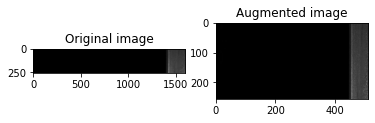

In [ ]:
image_path ='5b922560e.jpg'
files = {'image': open(image_path, 'rb').read()}
image_string = tf.io.read_file(base_path+image_path)
image = tf.image.decode_jpeg(image_string, channels=3)
cropped = tf.image.random_crop(image, size=[224, 1568, 3])
image = tf.image.convert_image_dtype(image, tf.float32)
cropped = tf.image.resize(image, [256, 512])
print(type(cropped))
print(cropped.shape)
visualize(image,cropped)
image.shape

##5.4 Creating Train,Val and Test batches

In [ ]:
#https://www.tensorflow.org/tutorials/images/data_augmentation
BATCH_SIZE = 8
augmented_train_batches = (
    train_dataset
    .cache()
    .shuffle(X_train.shape[0]//4,reshuffle_each_iteration=True)
    # The augmentation is added here.
    .map(parse_function, num_parallel_calls=AUTOTUNE)
    .map(augment, num_parallel_calls=AUTOTUNE)
    .map(image_resize)
    .batch(BATCH_SIZE)
    .prefetch(1)
)

val_batches = (
    val_dataset
    .cache()
    .map(parse_function, num_parallel_calls=AUTOTUNE)
    .map(image_resize)
    .batch(BATCH_SIZE)
    .prefetch(1)
)

test_batches = (
    test_dataset
    .cache()
    .map(parse_function, num_parallel_calls=AUTOTUNE)
    .map(image_resize)
    .batch(1)
    .prefetch(1)
)

augmented_test_batches = (
    test_dataset
    .cache()
    # The augmentation is added here.
    .map(parse_function, num_parallel_calls=AUTOTUNE)
    .map(augment, num_parallel_calls=AUTOTUNE)
    .map(image_resize)
    .batch(1)
    .prefetch(1)
)

## 5.5 Machine Learning Models- Classification

##5.6 Importing the InceptionResNetV2 trained on ImageNet dataset as the pre trained model

In [ ]:
pre_trained_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(include_top=False, weights='imagenet' ,input_shape=(256,512,3))

In [ ]:
pre_trained_model.trainable = False
for layer in pre_trained_model.layers:
    layer.trainable = False

In [ ]:
pre_trained_model.output.shape

TensorShape([None, 6, 14, 1536])

## 5.7 Define the model

In [ ]:
# Define the input
input = Input(shape=(256,512,3))

# Append the pre trained model
trained_model_output = pre_trained_model.output

# Append a pooling layer
glb_pool = GlobalAveragePooling2D()(trained_model_output)

# Define first layer of Dense-BatchNorm-Droput
layer1 = Dense(1024,activation='relu')(glb_pool)
batch_norm1 = BatchNormalization()(layer1)
dropout1 = Dropout(0.1)(batch_norm1)

# Define second layer of Dense-BatchNorm-Droput
layer2 = Dense(512,activation='relu')(dropout1)
batch_norm2 = BatchNormalization()(layer2)
dropout2 = Dropout(0.1)(batch_norm2)

# Define third layer of Dense-BatchNorm-Droput
layer3 = Dense(256,activation='relu')(dropout2)
batch_norm3 = BatchNormalization()(layer3)
# dropout3 = Dropout(0.3)(batch_norm3)

out = Dense(1,activation='sigmoid')(batch_norm3)

##5.8 Model Summary

In [ ]:
binary_model = Model(inputs=pre_trained_model.input, outputs=out)
binary_model.summary()  

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d_203 (Conv2D)             (None, 127, 255, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_206 (BatchN (None, 127, 255, 32) 96          conv2d_203[0][0]                 
__________________________________________________________________________________________________
activation_203 (Activation)     (None, 127, 255, 32) 0           batch_normalization_206[0][0]    
____________________________________________________________________________________________

In [ ]:
binary_model_optimizer = tf.keras.optimizers.Adam(1e-4)
start_epoch = tf.Variable(0)

##5.9 Checpoint to save the model and the epoch loss and accuracy

In [ ]:
#https://www.tensorflow.org/guide/checkpoint
#Checkpointing model after every epoch
checkpoint = tf.train.Checkpoint(start_epoch=start_epoch, binary_model_optimizer = binary_model_optimizer, binary_model = binary_model)
manager = tf.train.CheckpointManager(checkpoint, directory="./binary_model/tensorflow/checkpoints", max_to_keep=5)

In [ ]:
#https://www.tensorflow.org/tensorboard/get_started
#Checkpoinint loss and acc after every epoch for Tensorboard
# current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'binary_model/tensorflow/logs/gradient_tape' + '/train'
val_log_dir = 'binary_model/tensorflow/logs/gradient_tape' + '/val'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
val_summary_writer = tf.summary.create_file_writer(val_log_dir)

## 5.10 Training Step using gradient Tape

In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled" into a TF Graph
@tf.function
def train_step(images,labels):
    with tf.GradientTape() as model_tape:
      #Generating the model output
      model_output = binary_model(images, training=True)
      #Calculating the model loss
      model_loss = binary_crossentropy(labels, model_output)

    gradients_of_model = model_tape.gradient(model_loss, binary_model.trainable_variables)
   
    binary_model_optimizer.apply_gradients(zip(gradients_of_model, binary_model.trainable_variables))

## 5.11 Model Training

In [ ]:
def train_checkpoint_val(train_dataset, epochs , val_dataset):
  global start_epoch
  fig,ax = plt.subplots(1,1)
  ax.set_xlabel('epoch') ; ax.set_ylabel('Binary Cross Entropy loss')
  xs, ytrs, yvals = [], [], []

  # Restoring from latest checkpoint if stored 
  checkpoint.restore(manager.latest_checkpoint)
  if manager.latest_checkpoint:
    print("Restored from {}".format(manager.latest_checkpoint))
  else:
    print("Initializing from scratch.")
   

  # Training the data 
  for epoch in range(start_epoch.numpy(), epochs):
    start = time.time()

    for images,labels in train_dataset:
      # print(images.shape)
      labels = tf.reshape(labels,(-1,1))
      # print(label.shape)
      train_step(images,labels) 
    
    stop = time.time()  
    
    #Increment the start_epoch to save it in checkpoint
    start_epoch.assign_add(1)
     
    # Save the model after every epoch 
    manager.save()

    binary_model.compile(optimizer=binary_model_optimizer, loss=binary_crossentropy, metrics=["acc"])
    
    #Calculate train loss at the end of each epoch
    train_epoch_loss, train_epoch_acc = binary_model.evaluate(train_dataset,verbose=0)
    
    # Save the loss and acc for train
    with train_summary_writer.as_default():
      tf.summary.scalar('loss', train_epoch_loss, step=epoch)
      tf.summary.scalar('accuracy', train_epoch_acc, step=epoch)    
     
    #Calculate val loss at the end of each epoch
    val_epoch_loss, val_epoch_acc = binary_model.evaluate(val_dataset,verbose=0)

    # Save the loss and acc for val
    with val_summary_writer.as_default():
      tf.summary.scalar('loss', val_epoch_loss, step=epoch)
      tf.summary.scalar('accuracy', val_epoch_acc, step=epoch)    
      

    xs.append(epoch+1)
    ytrs.append(train_epoch_loss)
    yvals.append(val_epoch_loss)   

    print ('epoch: {} - time: {} sec - train_loss: {} - train_acc: {} - val_loss: {} - val_acc: {} -'.format(epoch + 1, np.round(stop-start) ,
           np.round(train_epoch_loss,2),np.round(train_epoch_acc,2),np.round(val_epoch_loss,2),np.round(val_epoch_acc,2) ))
  plt_dynamic(xs, ytrs, yvals, ax, fig)

Initializing from scratch.
epoch: 1 - time: 105.0 sec - train_loss: 0.32 - train_acc: 0.86 - val_loss: 0.29 - val_acc: 0.88 -
epoch: 2 - time: 96.0 sec - train_loss: 0.27 - train_acc: 0.88 - val_loss: 0.27 - val_acc: 0.89 -
epoch: 3 - time: 96.0 sec - train_loss: 0.28 - train_acc: 0.87 - val_loss: 0.29 - val_acc: 0.87 -
epoch: 4 - time: 96.0 sec - train_loss: 0.24 - train_acc: 0.9 - val_loss: 0.23 - val_acc: 0.91 -
epoch: 5 - time: 96.0 sec - train_loss: 0.25 - train_acc: 0.9 - val_loss: 0.23 - val_acc: 0.91 -
epoch: 6 - time: 96.0 sec - train_loss: 0.26 - train_acc: 0.89 - val_loss: 0.24 - val_acc: 0.91 -
epoch: 7 - time: 96.0 sec - train_loss: 0.25 - train_acc: 0.89 - val_loss: 0.26 - val_acc: 0.89 -
epoch: 8 - time: 96.0 sec - train_loss: 0.24 - train_acc: 0.9 - val_loss: 0.24 - val_acc: 0.91 -
epoch: 9 - time: 96.0 sec - train_loss: 0.23 - train_acc: 0.9 - val_loss: 0.24 - val_acc: 0.91 -
epoch: 10 - time: 96.0 sec - train_loss: 0.24 - train_acc: 0.9 - val_loss: 0.24 - val_acc: 0.8

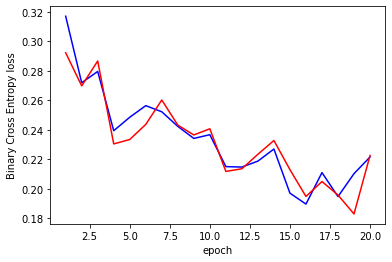

In [ ]:
train_checkpoint_val(augmented_train_batches, 20, val_batches)

Restored from ./binary_model/tensorflow/checkpoints/ckpt-20
epoch: 21 - time: 96.0 sec - train_loss: 0.2 - train_acc: 0.92 - val_loss: 0.18 - val_acc: 0.93 -
epoch: 22 - time: 96.0 sec - train_loss: 0.21 - train_acc: 0.91 - val_loss: 0.2 - val_acc: 0.92 -
epoch: 23 - time: 96.0 sec - train_loss: 0.19 - train_acc: 0.93 - val_loss: 0.19 - val_acc: 0.92 -
epoch: 24 - time: 96.0 sec - train_loss: 0.19 - train_acc: 0.93 - val_loss: 0.19 - val_acc: 0.93 -
epoch: 25 - time: 96.0 sec - train_loss: 0.19 - train_acc: 0.93 - val_loss: 0.22 - val_acc: 0.91 -
epoch: 26 - time: 96.0 sec - train_loss: 0.19 - train_acc: 0.92 - val_loss: 0.2 - val_acc: 0.92 -
epoch: 27 - time: 96.0 sec - train_loss: 0.18 - train_acc: 0.93 - val_loss: 0.19 - val_acc: 0.93 -
epoch: 28 - time: 96.0 sec - train_loss: 0.18 - train_acc: 0.93 - val_loss: 0.19 - val_acc: 0.93 -
epoch: 29 - time: 96.0 sec - train_loss: 0.18 - train_acc: 0.93 - val_loss: 0.2 - val_acc: 0.93 -
epoch: 30 - time: 96.0 sec - train_loss: 0.18 - train

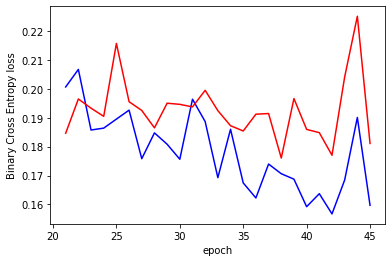

In [ ]:
train_checkpoint_val(augmented_train_batches, 45, val_batches)

In [ ]:
binary_model.save('binary_model/tensorflow/bst_model45.ckpt')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: binary_model/tensorflow/bst_model45.ckpt/assets






## 5.12 Tensorboard

In [ ]:
%tensorboard --logdir binary_model/tensorflow/

<IPython.core.display.Javascript object>

## 5.13 Evaluating on Test dataset to see if the model is reproducible


In [ ]:
model_binary_restored = load_model('binary_model/tensorflow/bst_model45.ckpt')

In [ ]:
score = model_binary_restored.evaluate(val_batches,verbose=1) 
print("log_loss:",score[0])
print("Val_Binary_Accuracy:",score[1])

283/283 [==============================] - 25s 88ms/step - loss: 0.1811 - acc: 0.9302
log_loss: 0.1810878962278366
Val_Binary_Accuracy: 0.9301811456680298


In [ ]:
score = model_binary_restored.evaluate(test_batches,verbose=1) 
print("log_loss:",score[0])
print("Val_Binary_Accuracy:",score[1])

1257/1257 [==============================] - 118s 94ms/step - loss: 0.1648 - acc: 0.9364
log_loss: 0.16478368639945984
Val_Binary_Accuracy: 0.9363564252853394


In [ ]:
score = model_binary_restored.evaluate(augmented_test_batches,verbose=1) 
print("log_loss:",score[0])
print("Val_Binary_Accuracy:",score[1])

1257/1257 [==============================] - 53s 42ms/step - loss: 0.1884 - acc: 0.9236
log_loss: 0.18838469684123993
Val_Binary_Accuracy: 0.9236276745796204


## 5.14 Predicting on Test Data

In [ ]:
y_pred_prob = model_binary_restored.predict(test_batches,verbose=1)

1257/1257 [==============================] - 50s 40ms/step


In [ ]:
y_pred_bool = np.array([0 if i <0.5  else 1 for i in y_pred_prob ])
Test_Accuracy = accuracy_score(X_test_data[['has_defect']].values,y_pred_bool)
print("Test_accuracy:", Test_Accuracy)

Test_accuracy: 0.9363564041368337


## 5.15 Test Time Augmentation

In [ ]:
#https://towardsdatascience.com/test-time-augmentation-tta-and-how-to-perform-it-with-keras-4ac19b67fb4d
tta_steps = 5
predictions = []

for i in tqdm(range(tta_steps)):
    y_pred_prob = model_binary_restored.predict(augmented_test_batches,verbose=1)

    predictions.append(y_pred_prob)

y_pred_prob = np.mean(predictions, axis=0)

1257/1257 [==============================] - 99s 79ms/step



In [ ]:
y_pred_bool = np.array([0 if i <0.5  else 1 for i in y_pred_prob ])
Test_Accuracy = accuracy_score(X_test_data[['has_defect']].values,y_pred_bool)
print("Test_accuracy:", Test_Accuracy)

Test_accuracy: 0.939538583929992





## 5.16 Classification Report

In [ ]:
print(classification_report(X_test_data[['has_defect']].values,y_pred_bool))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       590
           1       0.94      0.94      0.94       667

    accuracy                           0.94      1257
   macro avg       0.94      0.94      0.94      1257
weighted avg       0.94      0.94      0.94      1257



## 5.17 Confusion Matrix

In [ ]:
print(confusion_matrix(X_test_data[['has_defect']].values,y_pred_bool))

[[552  38]
 [ 38 629]]


In [ ]:
dataframe_proba = pd.DataFrame( columns = ['Pred_class_label','True_class_label'])
dataframe_proba['Pred_class_label'] = np.ndarray.flatten(y_pred_bool)
dataframe_proba['True_class_label'] = np.ndarray.flatten(X_test_data[['has_defect']].values)
dataframe_proba['ImageId'] = X_test_data['ImageId'].values

In [ ]:
dataframe_proba.head()

,Pred_class_label,True_class_label,ImageId
0,1,1,eb8fe7e47.jpg
1,0,0,2d26bebd3.jpg
2,0,0,b67f8ad07.jpg
3,1,1,8bd35f020.jpg
4,1,1,b14355f10.jpg


In [ ]:
#https://www.kaggle.com/go1dfish/clear-mask-visualization-and-simple-eda
def show_image(path, name):
    img = cv2.imread(str(train_path / idx))
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.set_title(name)
    ax.imshow(img)
    plt.show()

##5.18 Images with defect marked as non defective

In [ ]:
dataframe_proba[(dataframe_proba['Pred_class_label']==0) & (dataframe_proba['True_class_label']==1)].shape

(38, 2)

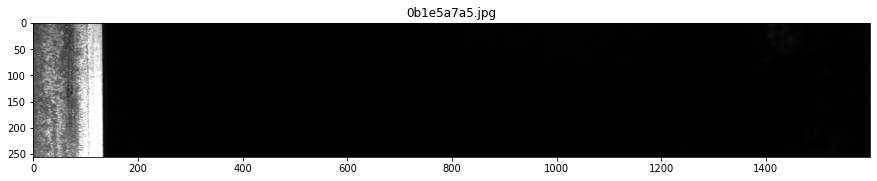

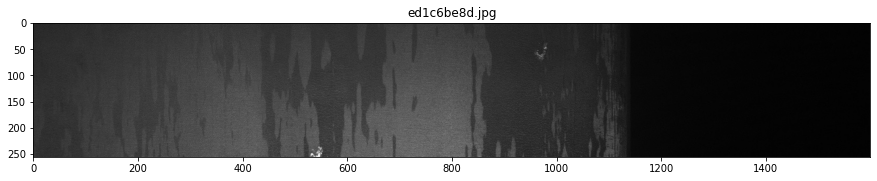

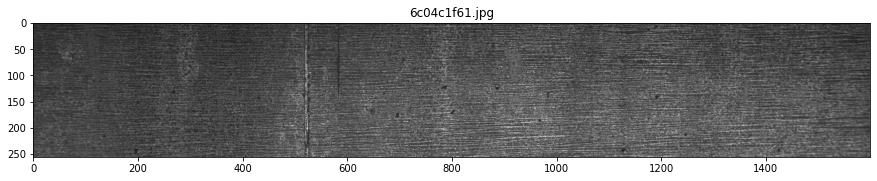

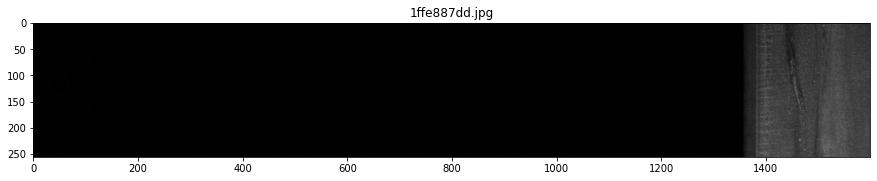

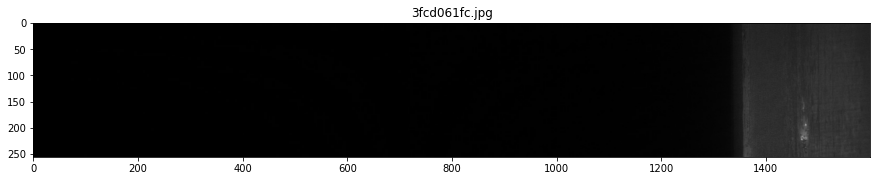

...

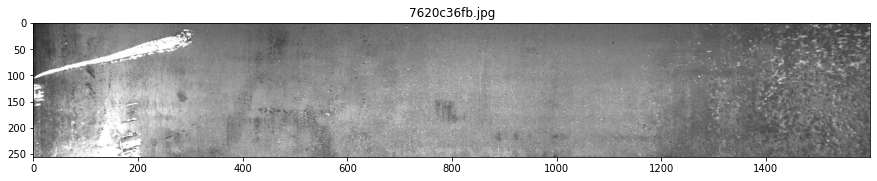

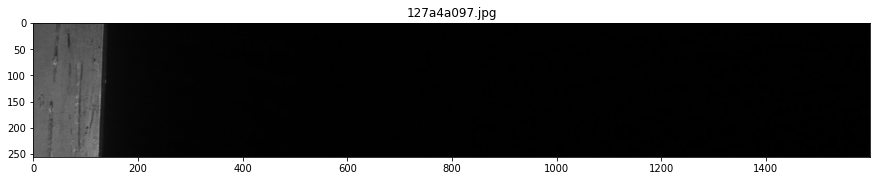

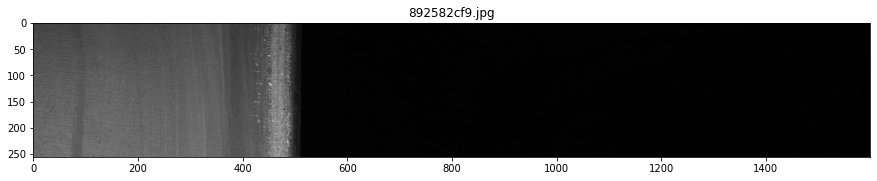

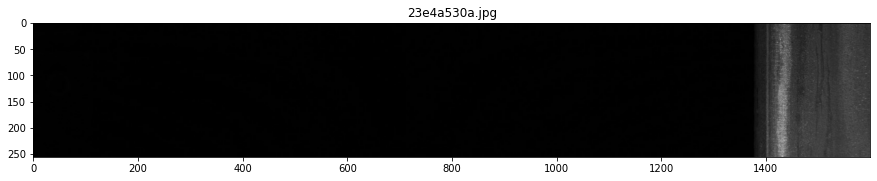

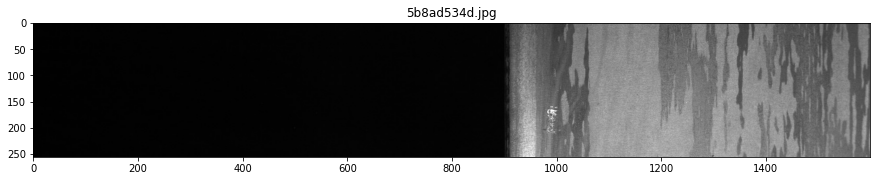

In [ ]:
train_path = Path("train_images/")
for idx in dataframe_proba[(dataframe_proba['Pred_class_label']==0) & (dataframe_proba['True_class_label']==1)]['ImageId'].values:
  show_image(train_path,idx)

### Some of them dont look defective. 

##5.18 Images with defect marked as non defective

In [ ]:
dataframe_proba[(dataframe_proba['Pred_class_label']==1) & (dataframe_proba['True_class_label']==0)].shape

(38, 3)

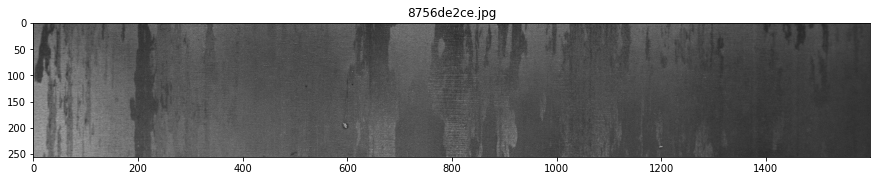

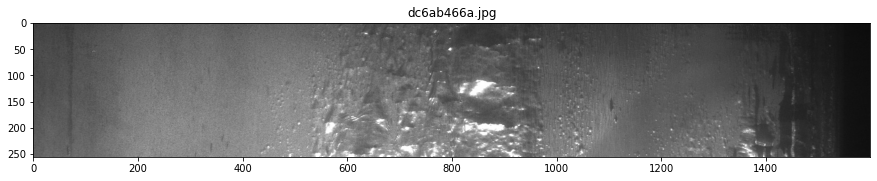

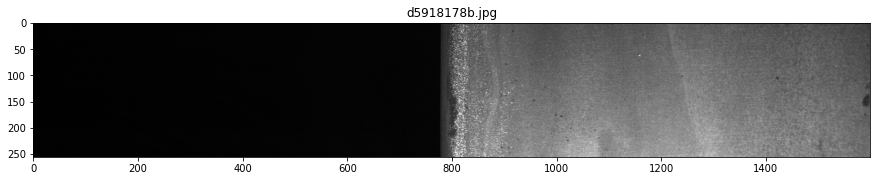

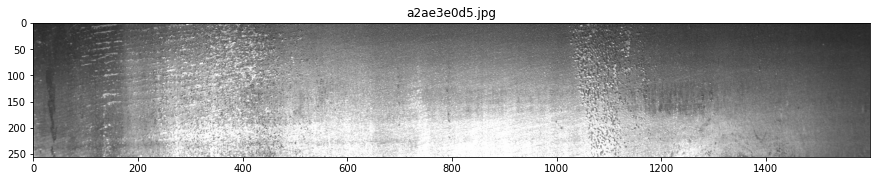

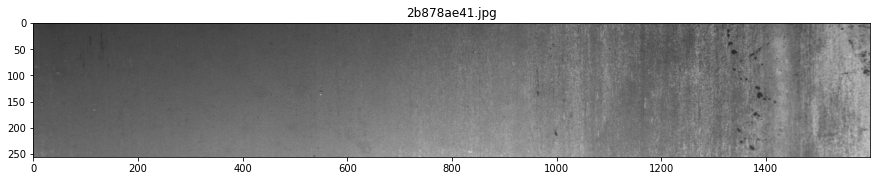

...

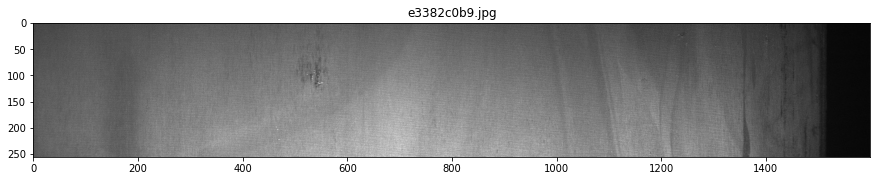

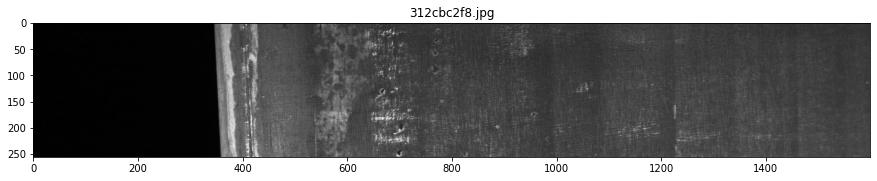

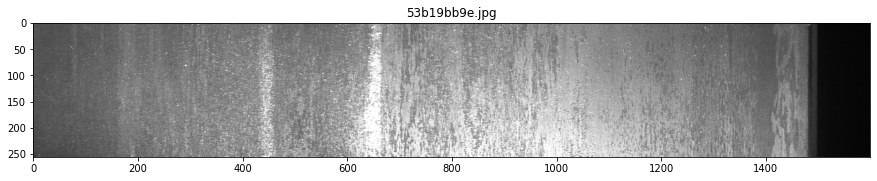

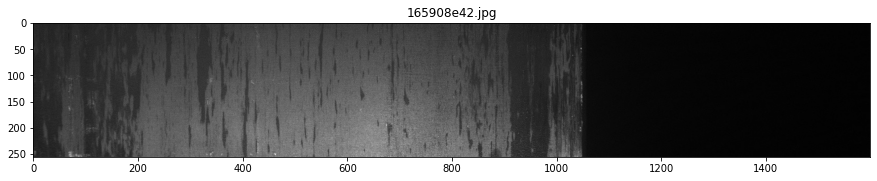

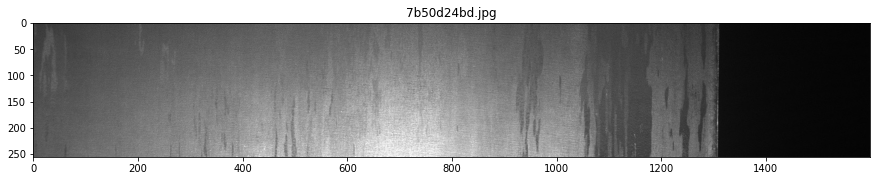

In [ ]:
train_path = Path("train_images/")
for idx in dataframe_proba[(dataframe_proba['Pred_class_label']==1) & (dataframe_proba['True_class_label']==0)]['ImageId'].values:
  show_image(train_path,idx)

##5.19 Conclusions

1. We are able to create a good Binary classifier which is able to give an accuracy of 94% by using TTA

#6 MULTILABLE CLASSIFICATION 


In [ ]:
X_train_data.head()

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,has_defect_1,has_defect_2,has_defect_3,has_defect_4,no_of_defects
4494,5b922560e.jpg,NaN,NaN,NaN,NaN,0,0,0,0,0,0
6708,87f74731f.jpg,NaN,NaN,218601 10 218839 29 219077 47 219315 66 219399...,NaN,1,0,0,1,0,1
11506,e9c9ac12d.jpg,NaN,NaN,138243 127 138499 254 138755 254 139011 254 13...,NaN,1,0,0,1,0,1
10930,dde377e40.jpg,NaN,NaN,NaN,NaN,0,0,0,0,0,0
2656,358a4fc0c.jpg,NaN,NaN,NaN,NaN,0,0,0,0,0,0


## 6.1 Train Test Split

In [ ]:
X_train_multilable = X_train_data['ImageId']
y_train_multilable = X_train_data[['has_defect_1','has_defect_2','has_defect_3','has_defect_4']]
X_val_multilable = X_val_data['ImageId']
y_val_multilable = X_val_data[['has_defect_1','has_defect_2','has_defect_3','has_defect_4']]
X_test_multilable = X_test_data['ImageId']
y_test_multilable = X_test_data[['has_defect_1','has_defect_2','has_defect_3','has_defect_4']]

In [ ]:
print(X_train_multilable.shape)
print(y_train_multilable.shape)
print(X_val_multilable.shape)
print(y_val_multilable.shape)
print(X_test_multilable.shape)
print(y_test_multilable.shape)

(9048,)
(9048, 4)
(2263,)
(2263, 4)
(1257,)
(1257, 4)


##6.2 Create dataset tensor

In [ ]:
train_dataset_multilable = tf.data.Dataset.from_tensor_slices((X_train_multilable, y_train_multilable))
val_dataset_multilable = tf.data.Dataset.from_tensor_slices((X_val_multilable, y_val_multilable))
test_dataset_multilable = tf.data.Dataset.from_tensor_slices((X_test_multilable, y_test_multilable))

In [ ]:
for i,j in train_dataset_multilable.take(1):
  print(i.numpy(),j.numpy())

b'5b922560e.jpg' [0 0 0 0]


In [ ]:
for i in train_dataset_multilable.take(5):
  print(i)

(<tf.Tensor: shape=(), dtype=string, numpy=b'5b922560e.jpg'>, <tf.Tensor: shape=(4,), dtype=int64, numpy=array([0, 0, 0, 0])>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'87f74731f.jpg'>, <tf.Tensor: shape=(4,), dtype=int64, numpy=array([0, 0, 1, 0])>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'e9c9ac12d.jpg'>, <tf.Tensor: shape=(4,), dtype=int64, numpy=array([0, 0, 1, 0])>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'dde377e40.jpg'>, <tf.Tensor: shape=(4,), dtype=int64, numpy=array([0, 0, 0, 0])>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'358a4fc0c.jpg'>, <tf.Tensor: shape=(4,), dtype=int64, numpy=array([0, 0, 0, 0])>)


##6.3 Creating Train, Val and Test batches

In [ ]:
#https://www.tensorflow.org/tutorials/images/data_augmentation
BATCH_SIZE = 8
augmented_train_batches_multilable = (
    train_dataset_multilable
    .cache()
    .shuffle(X_train.shape[0]//4,reshuffle_each_iteration=True)
    # The augmentation is added here.
    .map(parse_function, num_parallel_calls=AUTOTUNE)
    .map(augment, num_parallel_calls=AUTOTUNE)
    .map(image_resize)
    .batch(BATCH_SIZE)
    .prefetch(1)
)

val_batches_multilable = (
    val_dataset_multilable
    .cache()
    .map(parse_function, num_parallel_calls=AUTOTUNE)
    .map(image_resize)
    .batch(BATCH_SIZE)
    .prefetch(1)
)

test_batches_multilable = (
    test_dataset_multilable
    .cache()
    .map(parse_function, num_parallel_calls=AUTOTUNE)
    .map(image_resize)
    .batch(1)
    .prefetch(1)
)

augmented_test_batches_multilable = (
    test_dataset_multilable
    .cache()
    # The augmentation is added here.
    .map(parse_function, num_parallel_calls=AUTOTUNE)
    .map(augment, num_parallel_calls=AUTOTUNE)
    .map(image_resize)
    .batch(1)
    .prefetch(1)
)

##6.4 Loading Pretrained InceptionResnetv2 on Imagenet Dataset

In [ ]:
pre_trained_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(include_top=False, weights='imagenet' ,input_shape=(256,512,3))

219062272/219055592 [==============================] - 5s 0us/step


In [ ]:
for layer in pre_trained_model.layers:
    layer.trainable = False

## 6.5 Define the model

In [ ]:
# Define the input
input = Input(shape=(256,512,3))

# Append the pre trained model
trained_model_output = pre_trained_model.output

# Append a pooling layer
glb_pool = GlobalAveragePooling2D()(trained_model_output)

# Define first layer of Dense-BatchNorm-Droput
layer1 = Dense(1024,activation='relu')(glb_pool)
batch_norm1 = BatchNormalization()(layer1)
dropout1 = Dropout(0.0)(batch_norm1)

# Define second layer of Dense-BatchNorm-Droput
layer2 = Dense(512,activation='relu')(dropout1)
batch_norm2 = BatchNormalization()(layer2)
dropout2 = Dropout(0.0)(batch_norm2)

# Define third layer of Dense-BatchNorm-Droput
layer3 = Dense(128,activation='relu')(dropout2)
batch_norm3 = BatchNormalization()(layer3)
# dropout3 = Dropout(0.0)(batch_norm3)

out =Dense(4,activation='sigmoid')(batch_norm3)

##6.6 Model summary

In [ ]:
multilable_model = Model(inputs=pre_trained_model.input, outputs=out)
multilable_model.summary()  

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 127, 255, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 127, 255, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 127, 255, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [ ]:
multilable_model_optimizer = tf.keras.optimizers.Adam(1e-4)
start_epoch = tf.Variable(0)

## 6.7 Checkpointing

In [ ]:
#https://www.tensorflow.org/guide/checkpoint
#Checkpointing model after every epoch
checkpoint = tf.train.Checkpoint(start_epoch=start_epoch, multilable_model_optimizer = multilable_model_optimizer, multilable_model = multilable_model)
manager = tf.train.CheckpointManager(checkpoint, directory="./multilable_model_defect_only/tensorflow/checkpoints", max_to_keep=5)

In [ ]:
#https://www.tensorflow.org/tensorboard/get_started
#Checkpoinint loss and acc after every epoch for Tensorboard
# current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'multilable_model_defect_only/tensorflow/logs/gradient_tape' + '/train'
val_log_dir = 'multilable_model_defect_only/tensorflow/logs/gradient_tape' + '/val'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
val_summary_writer = tf.summary.create_file_writer(val_log_dir)

##6.8 Training step using gradient tape

In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled" into a TF Graph
@tf.function
def train_step(images,labels):
    with tf.GradientTape() as model_tape:
      #Generating the model output
      model_output = multilable_model(images, training=True)
      #Calculating the model loss
      model_loss = binary_crossentropy(labels, model_output)

    gradients_of_model = model_tape.gradient(model_loss, multilable_model.trainable_variables)
   
    multilable_model_optimizer.apply_gradients(zip(gradients_of_model, multilable_model.trainable_variables))

##6.9 Model training

In [ ]:
def train_checkpoint_val(train_dataset_multilable, epochs , val_dataset_multilable):
  global start_epoch
  fig,ax = plt.subplots(1,1)
  ax.set_xlabel('epoch') ; ax.set_ylabel('Binary Cross Entropy loss')
  xs, ytrs, yvals = [], [], []

  # Restoring from latest checkpoint if stored 
  checkpoint.restore(manager.latest_checkpoint)
  if manager.latest_checkpoint:
    print("Restored from {}".format(manager.latest_checkpoint))
  else:
    print("Initializing from scratch.")
   

  # Training the data 
  for epoch in range(start_epoch.numpy(), epochs):
    start = time.time()

    for images,labels in train_dataset_multilable:
      # print(images.shape)
      # labels = tf.reshape(labels,(-1,1))
      # print(label.shape)
      train_step(images,labels) 
    
    stop = time.time()  
    
    #Increment the start_epoch to save it in checkpoint
    start_epoch.assign_add(1)
     
    # Save the model after every epoch 
    manager.save()

    multilable_model.compile(optimizer=multilable_model_optimizer, loss=binary_crossentropy, metrics=['binary_accuracy' ,full_multi_label_accuracy_score])
    
    #Calculate train loss at the end of each epoch
    train_epoch_loss, train_epoch_acc ,train_epoch_full_multi_label_accuracy_score = multilable_model.evaluate(train_dataset_multilable,verbose=0)
    
    # Save the loss and acc for train
    with train_summary_writer.as_default():
      tf.summary.scalar('loss', train_epoch_loss, step=epoch)
      tf.summary.scalar('accuracy', train_epoch_acc, step=epoch) 
      tf.summary.scalar('categorical_accuracy', train_epoch_full_multi_label_accuracy_score, step=epoch)   
     
    #Calculate val loss at the end of each epoch
    val_epoch_loss, val_epoch_acc , val_epoch_full_multi_label_accuracy_score = multilable_model.evaluate(val_dataset_multilable,verbose=0)

    # Save the loss and acc for val
    with val_summary_writer.as_default():
      tf.summary.scalar('loss', val_epoch_loss, step=epoch)
      tf.summary.scalar('accuracy', val_epoch_acc, step=epoch)  
      tf.summary.scalar('categorical_accuracy', val_epoch_full_multi_label_accuracy_score, step=epoch)  
      

    xs.append(epoch+1)
    ytrs.append(train_epoch_loss)
    yvals.append(val_epoch_loss)   

    print ('epoch: {} - time: {} sec - train_loss: {} - train_acc: {} - train_full_multi_label_accuracy_score: {} - \
            val_loss: {} - val_acc: {} - val_full_multi_label_accuracy_score: {}-'.format(\
           epoch + 1, np.round(stop-start) ,np.round(train_epoch_loss,2),np.round(train_epoch_acc,2),np.round(train_epoch_full_multi_label_accuracy_score,2),
           np.round(val_epoch_loss,2),np.round(val_epoch_acc,2),np.round(val_epoch_full_multi_label_accuracy_score,2)))
  plt_dynamic(xs, ytrs, yvals, ax, fig)

Initializing from scratch.
epoch: 1 - time: 100.0 sec - train_loss: 0.38 - train_acc: 0.87 - train_full_multi_label_accuracy_score: 0.59 -             val_loss: 0.37 - val_acc: 0.88 - val_full_multi_label_accuracy_score: 0.6-
epoch: 2 - time: 92.0 sec - train_loss: 0.2 - train_acc: 0.94 - train_full_multi_label_accuracy_score: 0.79 -             val_loss: 0.19 - val_acc: 0.94 - val_full_multi_label_accuracy_score: 0.79-
epoch: 3 - time: 92.0 sec - train_loss: 0.15 - train_acc: 0.94 - train_full_multi_label_accuracy_score: 0.81 -             val_loss: 0.15 - val_acc: 0.95 - val_full_multi_label_accuracy_score: 0.81-
epoch: 4 - time: 92.0 sec - train_loss: 0.15 - train_acc: 0.94 - train_full_multi_label_accuracy_score: 0.81 -             val_loss: 0.14 - val_acc: 0.94 - val_full_multi_label_accuracy_score: 0.8-
epoch: 5 - time: 92.0 sec - train_loss: 0.14 - train_acc: 0.95 - train_full_multi_label_accuracy_score: 0.82 -             val_loss: 0.14 - val_acc: 0.95 - val_full_multi_label_ac

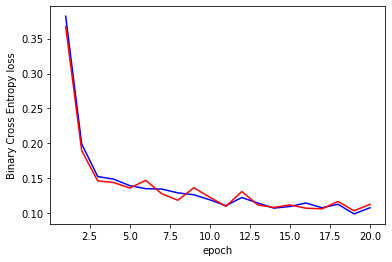

In [ ]:
train_checkpoint_val(augmented_train_batches_multilable, 20, val_batches_multilable)

Restored from ./multilable_model_defect_only/tensorflow/checkpoints/ckpt-26
epoch: 27 - time: 1400.0 sec - train_loss: 0.1 - train_acc: 0.96 - train_full_multi_label_accuracy_score: 0.87 -             val_loss: 0.1 - val_acc: 0.96 - val_full_multi_label_accuracy_score: 0.86-
epoch: 28 - time: 93.0 sec - train_loss: 0.09 - train_acc: 0.96 - train_full_multi_label_accuracy_score: 0.87 -             val_loss: 0.1 - val_acc: 0.96 - val_full_multi_label_accuracy_score: 0.87-
epoch: 29 - time: 93.0 sec - train_loss: 0.1 - train_acc: 0.96 - train_full_multi_label_accuracy_score: 0.86 -             val_loss: 0.1 - val_acc: 0.96 - val_full_multi_label_accuracy_score: 0.86-
epoch: 30 - time: 93.0 sec - train_loss: 0.1 - train_acc: 0.96 - train_full_multi_label_accuracy_score: 0.86 -             val_loss: 0.1 - val_acc: 0.96 - val_full_multi_label_accuracy_score: 0.86-


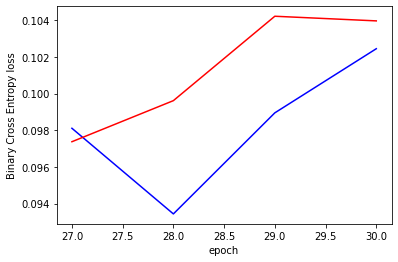

In [ ]:
train_checkpoint_val(augmented_train_batches_multilable, 30, val_batches_multilable)

In [ ]:
checkpoint.restore('./multilable_model_defect_only/tensorflow/checkpoints/ckpt-28')

In [ ]:
multilable_model.save('multilable_model_defect_only/tensorflow/bst_model28.ckpt')

INFO:tensorflow:Assets written to: multilable_model_defect_only/tensorflow/bst_model28.ckpt/assets


##6. 10 Tensorboard

In [ ]:
%tensorboard --logdir multilable_model_defect_only/tensorflow/

<IPython.core.display.Javascript object>

In [ ]:
model_multilable_restored = load_model('multilable_model_defect_only/tensorflow/bst_model28.ckpt',custom_objects=dependencies_multilable)

## 6.11 Evaluating on Test dataset to see if the model is reproducible

In [ ]:
score = model_multilable_restored.evaluate(augmented_train_batches_multilable,verbose=1) 
print("log_loss:",score[0])
print("Val_Binary_Accuracy:",score[1])
print("Val_Categorical_Accuracy:",score[2])

1131/1131 [==============================] - 101s 89ms/step - loss: 0.0927 - binary_accuracy: 0.9634 - full_multi_label_accuracy_score: 0.8715
log_loss: 0.09269107133150101
Val_Binary_Accuracy: 0.9633896946907043
Val_Categorical_Accuracy: 0.8714632987976074


In [ ]:
score = model_multilable_restored.evaluate(val_batches_multilable,verbose=1) 
print("log_loss:",score[0])
print("Val_Binary_Accuracy:",score[1])
print("Val_Categorical_Accuracy:",score[2])

283/283 [==============================] - 25s 88ms/step - loss: 0.0996 - binary_accuracy: 0.9609 - full_multi_label_accuracy_score: 0.8653
log_loss: 0.09961819648742676
Val_Binary_Accuracy: 0.9608926177024841
Val_Categorical_Accuracy: 0.8652827143669128


##6.12 Predicting on Test Data

In [ ]:
y_pred_prob = model_multilable_restored.predict(test_batches_multilable,verbose=1)
y_pred_bool = np.array([0 if j <0.5  else 1 for i in y_pred_prob for j in i]).reshape(-1,4)
Test_Accuracy = accuracy_score(y_test_multilable[['has_defect_1','has_defect_2','has_defect_3','has_defect_4']].values,y_pred_bool)
print("Test_accuracy:", Test_Accuracy)

1257/1257 [==============================] - 50s 40ms/step
Test_accuracy: 0.8544152744630071


In [ ]:
y_pred_prob = model_multilable_restored.predict(augmented_test_batches_multilable,verbose=1)
y_pred_bool = np.array([0 if j <0.5  else 1 for i in y_pred_prob for j in i]).reshape(-1,4)
Test_Accuracy = accuracy_score(y_test_multilable[['has_defect_1','has_defect_2','has_defect_3','has_defect_4']].values,y_pred_bool)
print("Test_accuracy:", Test_Accuracy)

1257/1257 [==============================] - 52s 41ms/step
Test_accuracy: 0.8392999204455052


##6.13 Test Time Augmentation

In [ ]:
#https://towardsdatascience.com/test-time-augmentation-tta-and-how-to-perform-it-with-keras-4ac19b67fb4d
tta_steps = 5
predictions = []

for i in tqdm(range(tta_steps)):
    y_pred_prob = model_multilable_restored.predict(augmented_test_batches_multilable,verbose=1)

    predictions.append(y_pred_prob)

y_pred_prob = np.mean(predictions, axis=0)

1257/1257 [==============================] - 52s 42ms/step



In [ ]:
y_pred_prob = model_multilable_restored.predict(augmented_test_batches_multilable,verbose=1)
y_pred_bool = np.array([0 if j <0.5  else 1 for i in y_pred_prob for j in i]).reshape(-1,4)
Test_Accuracy = accuracy_score(y_test_multilable[['has_defect_1','has_defect_2','has_defect_3','has_defect_4']].values,y_pred_bool)
print("Test_accuracy:", Test_Accuracy)

1257/1257 [==============================] - 52s 42ms/step
Test_accuracy: 0.8408910103420844


##6.14 Classification report

In [ ]:
print(classification_report(y_test_multilable[['has_defect_1','has_defect_2','has_defect_3','has_defect_4']].values, y_pred_bool))

              precision    recall  f1-score   support

           0       0.83      0.66      0.73        82
           1       0.58      0.88      0.70        24
           2       0.89      0.85      0.87       517
           3       0.92      0.79      0.85        87

   micro avg       0.87      0.82      0.84       710
   macro avg       0.81      0.79      0.79       710
weighted avg       0.88      0.82      0.85       710
 samples avg       0.44      0.44      0.44       710



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


##6.15 Confusion Matrix

-------------------- Confusion matrix --------------------


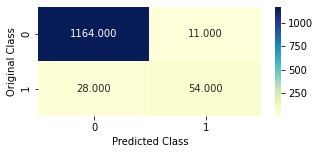

-------------------- Confusion matrix --------------------


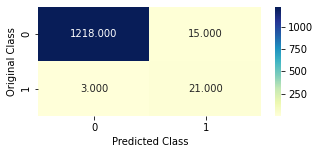

-------------------- Confusion matrix --------------------


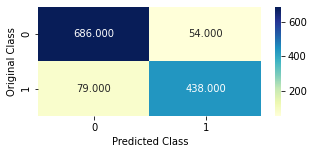

-------------------- Confusion matrix --------------------


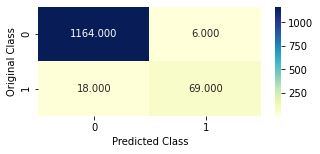

In [ ]:
for i in multilabel_confusion_matrix(y_test_multilable[['has_defect_1','has_defect_2','has_defect_3','has_defect_4']].values, y_pred_bool):
  labels = [0,1]
  print("-"*20, "Confusion matrix", "-"*20)
  plt.figure(figsize=(5,2))
  sns.heatmap(i, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.show()